In [1]:
# unzip files in inpainting
!pwd

/content


https://github.com/naoto0804/pytorch-inpainting-with-partial-conv

In [4]:
import os

zip_file_path = '/content/pytorch-inpainting-with-partial-conv-0.0.0.zip'

# Check if the zip file exists before attempting to unzip
if os.path.exists(zip_file_path):
    # Unzip the file to the current directory
    os.system(f'unzip -q {zip_file_path} -d /content/')
    print(f'Successfully unzipped {zip_file_path} to /content/')
    # List the contents of the directory where the files were unzipped
    print('\nContents after unzipping:')
    os.system('ls -F /content/')
else:
    print(f'Error: The file {zip_file_path} does not exist.')

Successfully unzipped /content/pytorch-inpainting-with-partial-conv-0.0.0.zip to /content/

Contents after unzipping:


In [3]:
# os.system(f'unzip -q /content/PlacesTestSet.zip -d /content/')
# os.system(f'unzip -q /content/masks_variety_for_iizuka.zip -d /content/')

0

In [6]:
# Install dependencies from requirements.txt
# Due to issues with old versions, install numpy and Pillow without strict version constraints first.
%pip install numpy Pillow --upgrade --user
%pip install -r /content/pytorch-inpainting-with-partial-conv/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 19.5 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [8]:
!ls /content/pytorch-inpainting-with-partial-conv-0.0.0

evaluation.py	  loss.py  places2.py	     result_iter_1000000.jpg  util
generate_data.py  net.py   README.md	     test.py
LICENSE		  opt.py   requirements.txt  train.py


In [1]:
import sys
# Add the project directory to the Python path to import modules
sys.path.append('/content/pytorch-inpainting-with-partial-conv-0.0.0')
import os

import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils

# Assuming InpaintGenerator is defined in net.py and Places2Dataset in places2.py
from net import PConvUNet # This is a common class name for the generator
from places2 import Places2 # This is a common class name for the Places2 dataset

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


Now, I'll initialize the generator model and load the pre-trained weights from `iter_1000000.pth`.

In [5]:
# Initialize the generator model with common parameters for PartialConv inpainting.
# The exact constructor signature can be verified in `net.py`.
# The PConvUNet in this implementation primarily uses 'layer_size'.
generator = PConvUNet(layer_size=7).to(device) # Assuming default layer_size=7 as seen in net.py

# Load pre-trained weights
model_path = '/content/iter_1000000.pth'
if torch.cuda.is_available():
    checkpoint = torch.load(model_path)
else:
    checkpoint = torch.load(model_path, map_location=torch.device('cpu'))

# Load the state dictionary into the model
# Check if the checkpoint is a dict containing 'model' or 'state_dict' or the state_dict directly
if isinstance(checkpoint, dict) and 'model' in checkpoint:
    generator.load_state_dict(checkpoint['model'])
elif isinstance(checkpoint, dict) and 'state_dict' in checkpoint:
    generator.load_state_dict(checkpoint['state_dict'])
else:
    generator.load_state_dict(checkpoint)

generator.eval() # Set model to evaluation mode
print("Generator loaded successfully.")

Generator loaded successfully.


Processing image: /content/places2_data/test_256/Places365_test_00297720.jpg with mask: /content/generated_masks/000016.jpg
Saved inpainted image to /content/test_results/inpainted_result_0.png


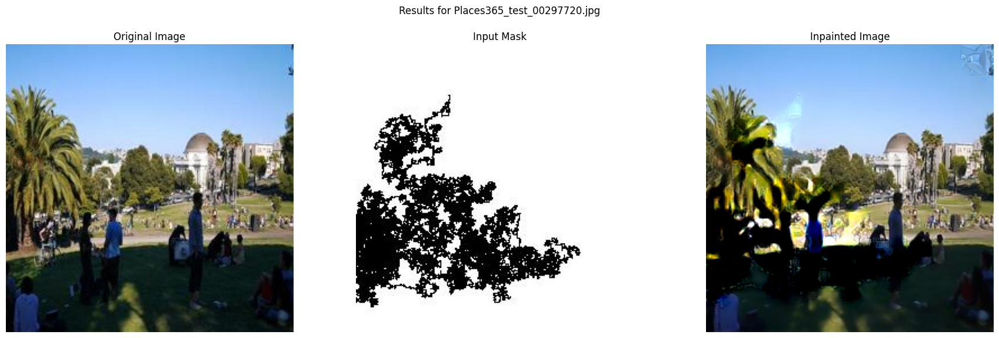

Processing image: /content/places2_data/test_256/Places365_test_00012763.jpg with mask: /content/generated_masks/000014.jpg
Saved inpainted image to /content/test_results/inpainted_result_1.png


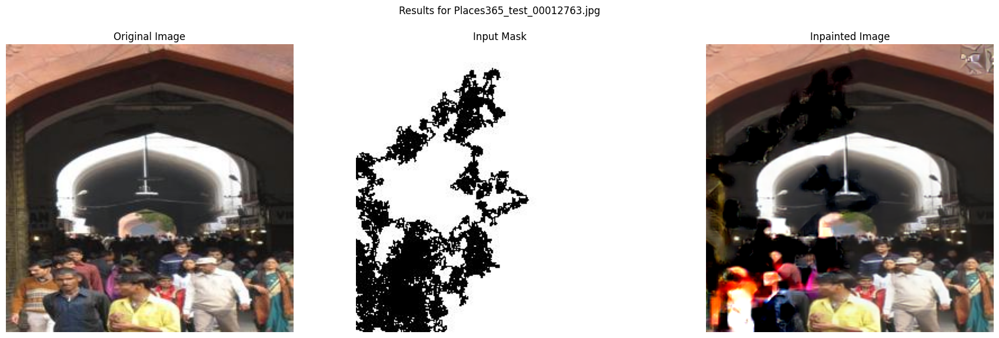

Processing image: /content/places2_data/test_256/Places365_test_00164329.jpg with mask: /content/generated_masks/000004.jpg
Saved inpainted image to /content/test_results/inpainted_result_2.png


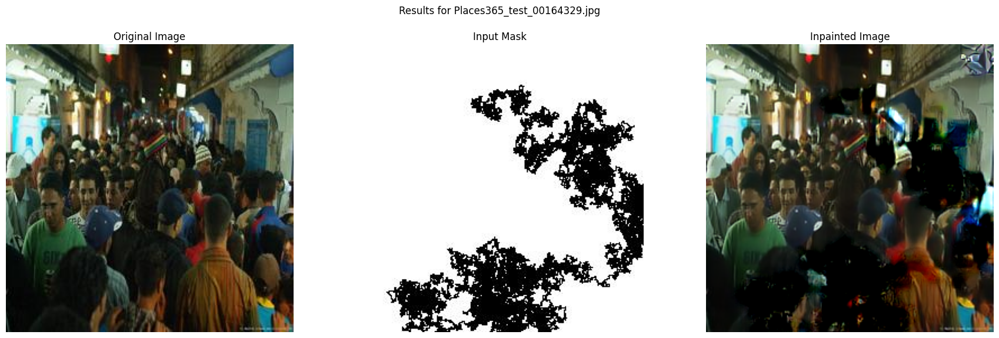

Processing image: /content/places2_data/test_256/Places365_test_00103010.jpg with mask: /content/generated_masks/000006.jpg
Saved inpainted image to /content/test_results/inpainted_result_3.png


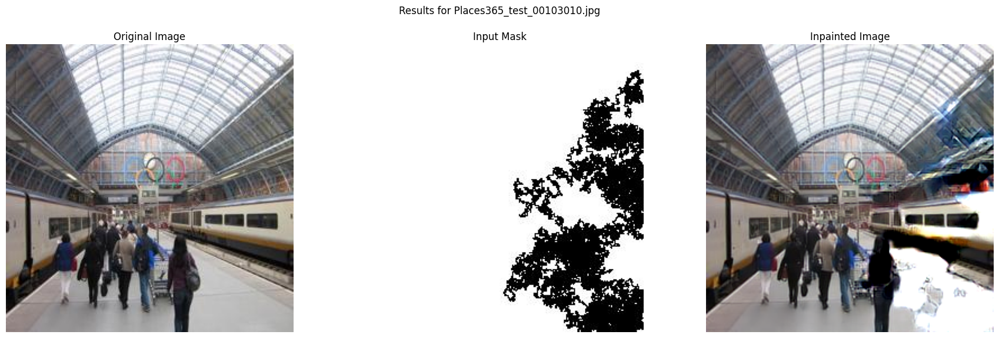

Processing image: /content/places2_data/test_256/Places365_test_00086904.jpg with mask: /content/generated_masks/000000.jpg
Saved inpainted image to /content/test_results/inpainted_result_4.png


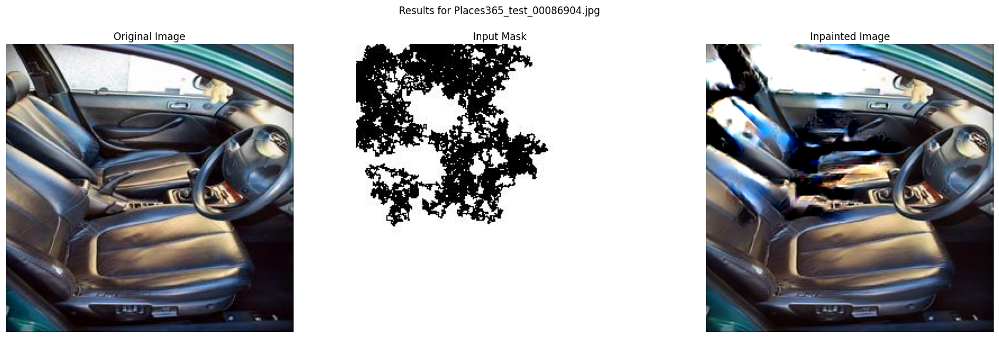

Processing image: /content/places2_data/test_256/Places365_test_00047345.jpg with mask: /content/generated_masks/000029.jpg
Saved inpainted image to /content/test_results/inpainted_result_5.png


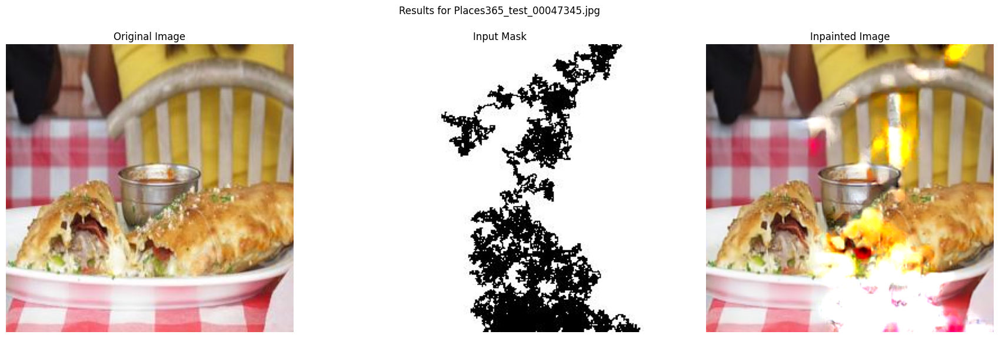

Processing image: /content/places2_data/test_256/Places365_test_00256497.jpg with mask: /content/generated_masks/000002.jpg
Saved inpainted image to /content/test_results/inpainted_result_6.png


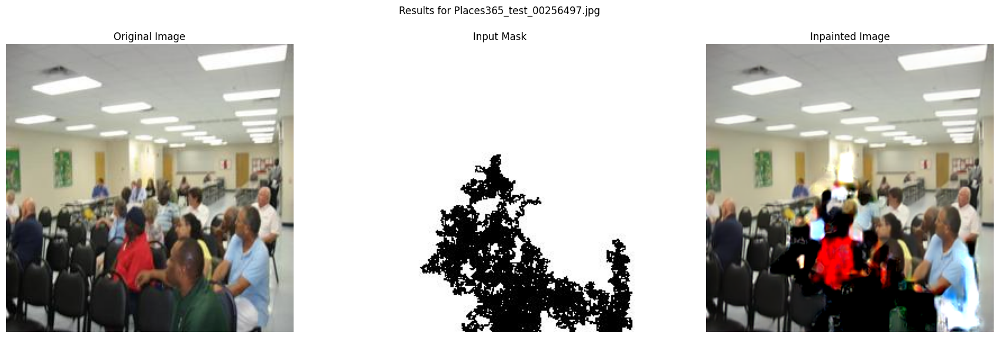

Processing image: /content/places2_data/test_256/Places365_test_00310690.jpg with mask: /content/generated_masks/000031.jpg
Saved inpainted image to /content/test_results/inpainted_result_7.png


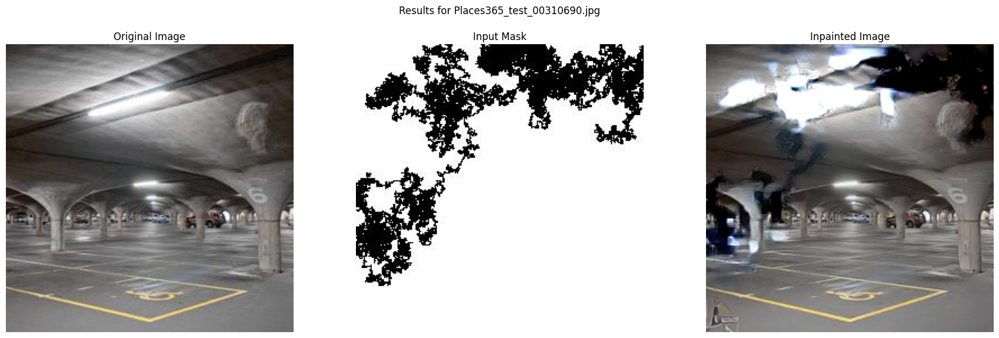

Processing image: /content/places2_data/test_256/Places365_test_00274729.jpg with mask: /content/generated_masks/000048.jpg
Saved inpainted image to /content/test_results/inpainted_result_8.png


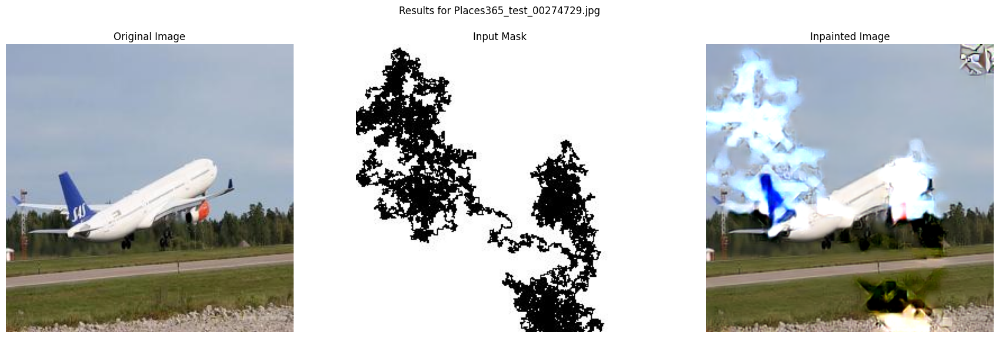

Processing image: /content/places2_data/test_256/Places365_test_00203693.jpg with mask: /content/generated_masks/000045.jpg
Saved inpainted image to /content/test_results/inpainted_result_9.png


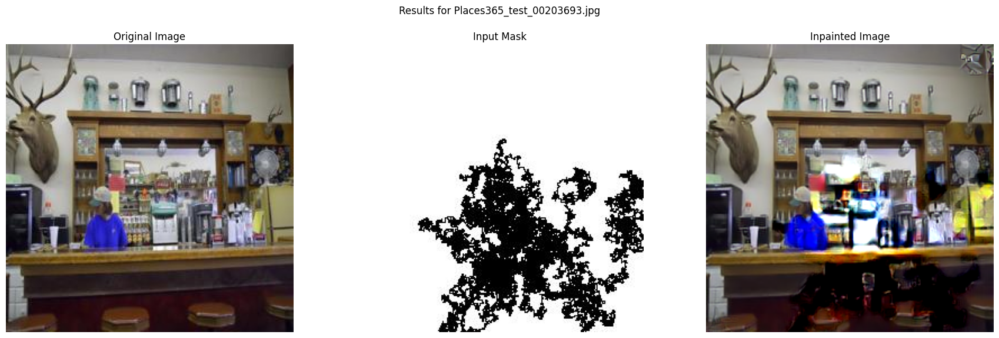

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np

# Ensure opt module is imported for MEAN and STD
import opt
from util.image import unnormalize # Import the unnormalize utility function

# The generator model and device should already be defined from previous cells
# generator, device, model_path, image_size are available

image_size = 256

size = (image_size, image_size)
img_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor(),
     transforms.Normalize(mean=opt.MEAN, std=opt.STD)])
mask_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor()])

generator.eval() # Ensure model is in evaluation mode

# Loop through the selected image and mask paths
for i in range(len(test_image_path)):
    current_image_path = test_image_path[i]
    current_mask_path = test_mask_path[i]

    print(f"Processing image: {current_image_path} with mask: {current_mask_path}")

    # Load image and mask
    img = Image.open(current_image_path).convert('RGB')
    mask = Image.open(current_mask_path).convert('RGB') # Masks might be grayscale, convert to RGB for consistency

    # Apply transforms
    input_img_tensor = img_transform(img).unsqueeze(0).to(device) # Add batch dimension
    input_mask_tensor = mask_transform(mask).unsqueeze(0).to(device) # Add batch dimension

    with torch.no_grad():
        output_tensor, _ = generator(input_img_tensor, input_mask_tensor) # Unpack the tuple output

    # Post-process output for display
    # Denormalize the original input image tensor for display
    original_img_denorm = unnormalize(input_img_tensor.cpu()).squeeze(0) # Pass 4D tensor, then squeeze(0)
    original_img_denorm = original_img_denorm.clamp(0, 1)

    # Denormalize the model output tensor for display
    output_denorm = unnormalize(output_tensor.cpu()).squeeze(0) # Pass 4D tensor, then squeeze(0)
    output_denorm = output_denorm.clamp(0, 1)

    # Convert tensors back to PIL Image for display
    original_display = transforms.ToPILImage()(original_img_denorm)
    mask_display = transforms.ToPILImage()(input_mask_tensor.cpu().squeeze(0).mean(dim=0, keepdim=True).repeat(3,1,1))
    output_display = transforms.ToPILImage()(output_denorm)

    # Create a temporary output path for saving
    output_file_name = f"inpainted_result_{i}.png"
    output_full_path = os.path.join(test_output_dir, output_file_name)
    output_display.save(output_full_path)
    print(f"Saved inpainted image to {output_full_path}")

    # Display the generated images (original, masked, and inpainted)
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(original_display)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(mask_display)
    axes[1].set_title('Input Mask')
    axes[1].axis('off')

    axes[2].imshow(output_display)
    axes[2].set_title('Inpainted Image')
    axes[2].axis('off')

    plt.suptitle(f"Results for {os.path.basename(current_image_path)}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [ ]:
!python /content/pytorch-inpainting-with-partial-conv-0.0.0/test.py --root /content/temp_test_input/images/  --mask_root /content/temp_test_input/masks/ --snapshot /content/iter_1000000.pth --image_size 256

Top to bottom: input, mask, image generated by the network, image which is combined with the original non-masked region of image, ground truth)

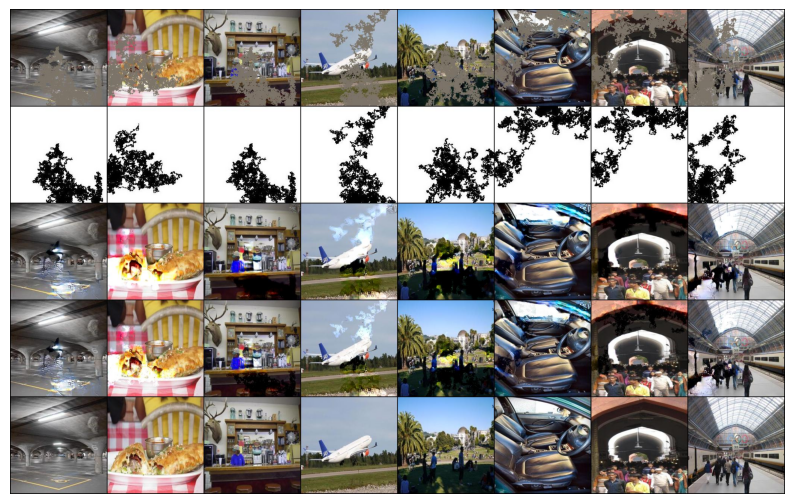

In [ ]:
# Load and show result.jpg from the test script
result_image_path = '/content/result.jpg'
result_image = Image.open(result_image_path)
plt.figure(figsize=(10, 10))
plt.imshow(result_image)
plt.axis('off')
plt.show()

In [7]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np

# Ensure opt module is imported for MEAN and STD
import opt
from util.image import unnormalize # Import the unnormalize utility function

# The generator model and device should already be defined from previous cells
# generator, device, model_path, image_size are available

image_size = 256

size = (image_size, image_size)
img_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor(),
     transforms.Normalize(mean=opt.MEAN, std=opt.STD)])
mask_transform = transforms.Compose(
    [transforms.Resize(size=size), transforms.ToTensor()])

image_list = sorted([f for f in os.listdir("/content/PlacesTestSet")
                     if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])

mask_list = sorted([f for f in os.listdir("/content/masks_variety_for_iizuka")
                    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])

output_dir = "/content/PartConvOutput"
os.makedirs(output_dir, exist_ok=True)

counter = 0;

generator.eval() # Ensure model is in evaluation mode

for img_name in image_list:
  img_path = os.path.join("/content/PlacesTestSet", img_name)
  # Load image and mask
  img = Image.open(img_path).convert('RGB')
  # Apply transforms
  input_img_tensor = img_transform(img).unsqueeze(0).to(device) # Add batch dimension

  for mask_name in mask_list:
    mask_path = os.path.join("/content/masks_variety_for_iizuka", mask_name)
    mask = Image.open(mask_path).convert('RGB') # Masks might be grayscale, convert to RGB for consistency
    input_mask_tensor = mask_transform(mask).unsqueeze(0).to(device) # Add batch dimension

    with torch.no_grad():
        output_tensor, _ = generator(input_img_tensor, input_mask_tensor) # Unpack the tuple output

    # Denormalize the model output tensor for display
    output_denorm = unnormalize(output_tensor.cpu()).squeeze(0) # Pass 4D tensor, then squeeze(0)
    output_denorm = output_denorm.clamp(0, 1)

    # Convert tensors back to PIL Image for display
    output_display = transforms.ToPILImage()(output_denorm)

    img_base = os.path.splitext(img_name)[0]
    mask_base = os.path.splitext(mask_name)[0]

    out_name = "{}__{}.png".format(img_base, mask_base)
    out_path = os.path.join(output_dir, out_name)
    output_display.save(out_path)

    counter += 1
    if (counter % 1000 == 0):
      print(f"Processed {counter} images.")

Streaming output truncated to the last 5000 lines.
Processed 7099 images

Processed 7100 images

Processed 7101 images

Processed 7102 images

Processed 7103 images

Processed 7104 images

Processed 7105 images

Processed 7106 images

Processed 7107 images

Processed 7108 images

Processed 7109 images

Processed 7110 images

Processed 7111 images

Processed 7112 images

Processed 7113 images

Processed 7114 images

Processed 7115 images

Processed 7116 images

Processed 7117 images

Processed 7118 images

Processed 7119 images

Processed 7120 images

Processed 7121 images

Processed 7122 images

Processed 7123 images

Processed 7124 images

Processed 7125 images

Processed 7126 images

Processed 7127 images

Processed 7128 images

Processed 7129 images

Processed 7130 images

Processed 7131 images

Processed 7132 images

Processed 7133 images

Processed 7134 images

Processed 7135 images

Processed 7136 images

Processed 7137 images

Processed 7138 images

Processed 7139 images

Proces

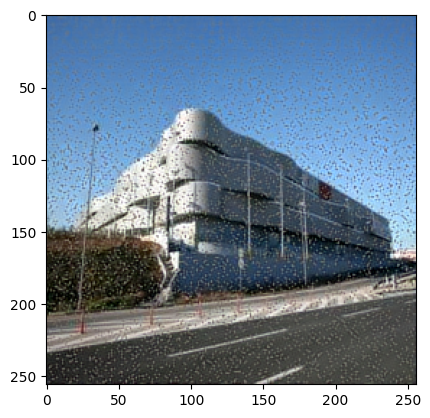

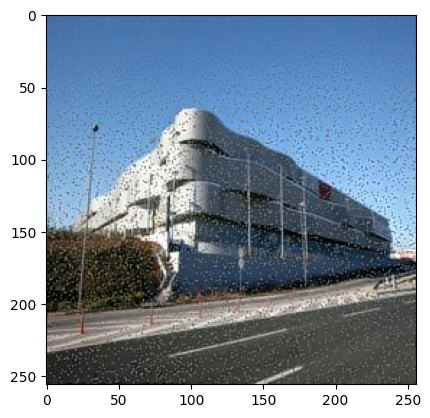

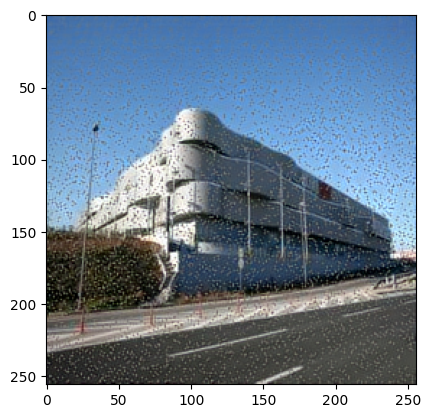

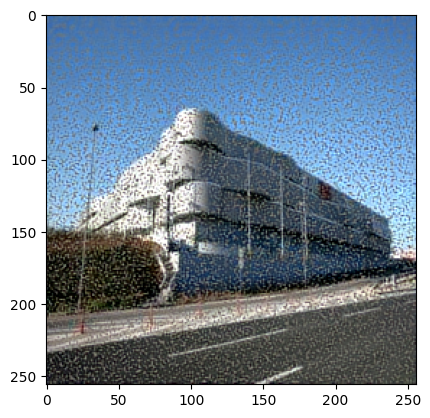

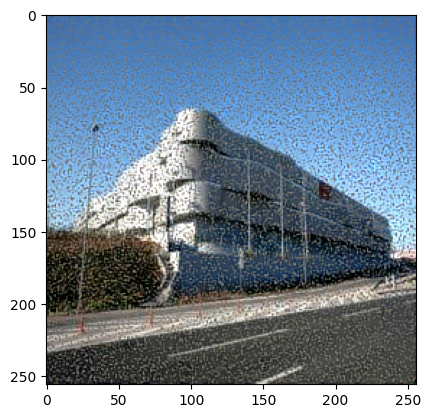

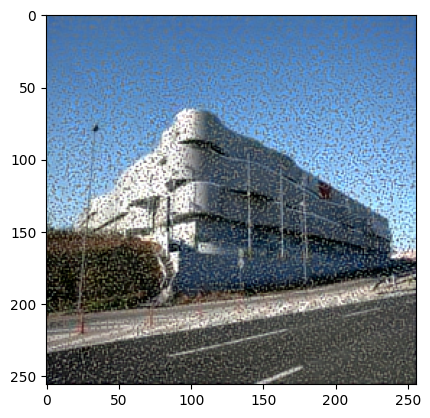

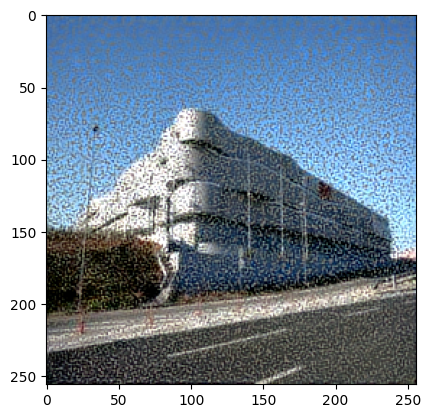

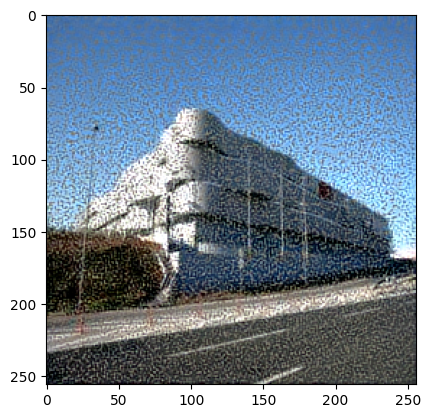

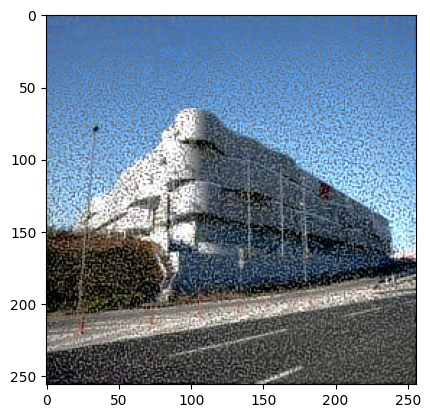

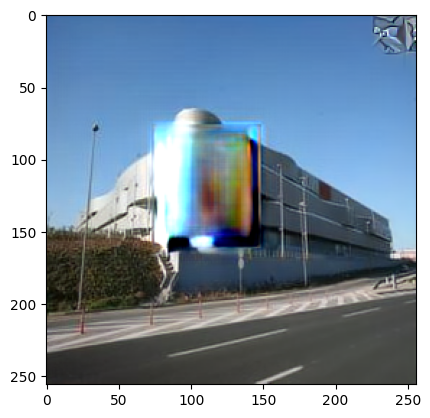

In [12]:
output_list = sorted([f for f in os.listdir("/content/PartConvOutput")
                     if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
output_test = output_list[:10]
for out in output_test:
  out_path = os.path.join("/content/PartConvOutput", out)
  img = Image.open(out_path).convert('RGB')
  plt.imshow(img)
  plt.show()

In [14]:
# Download the output directory to save the data
!zip -r /content/PartConvOutput.zip /content/PartConvOutput

from google.colab import files
files.download('/content/PartConvOutput.zip')

Streaming output truncated to the last 5000 lines.
  adding: content/PartConvOutput/Places365_test_00000200__000021.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000087__000033.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000077__000019.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000004__000021.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000026__000033.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000088__000006.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000185__000032.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000008__000038.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000182__000032.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000163__000040.png (deflated 0%)
  adding: content/PartConvOutput/Places365_test_00000043__000017.png (deflated 0%)
  adding: content/PartConvOutput/Pla

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
# IMPORTS
import os
import math
import glob
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


import torch
import torchvision.transforms as T
from torchmetrics.functional import structural_similarity_index_measure as ssim_fn   # pip install torchmetrics
import lpips   # pip install lpips

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# !pip install torchmetrics
# !pip install lpips

In [20]:
# ----------------------------
# 1. L1 METRIC
# ----------------------------

def compute_L1(img_pred, img_gt, mask=None):
    """
    Computes L1 error between predicted and ground-truth image.

    Args:
        img_pred, img_gt: tensors of shape (C, H, W), values in [0,1]
        mask (optional): tensor of shape (1, H, W) or (C, H, W)
                         1 = region to evaluate (hole)
                         0 = ignore

    Returns:    scalar L1 error    (lower the better)
    """

    # absolute pixel-wise difference
    diff = torch.abs(img_pred - img_gt)

    # if a mask is given, we compute L1 on whole image (see return line), otherwise L1 on generated area
    if mask is not None:

        # ensure mask has same number of channels (broadcast if needed)
        if mask.shape[0] == 1:
            mask = mask.expand_as(diff)

        diff = diff * mask          # apply mask (keep only hole region)
        valid_pixels = mask.sum()   # number of valid pixels (per channel)
        return diff.sum() / (valid_pixels + 1e-8)   # avoid division by zero (e.g. empty mask)

    # full-image L1
    return diff.mean()

# ----------------------------
# 2. PSNR METRIC
# ----------------------------

def compute_psnr(img_pred, img_gt, mask=None, eps=1e-8):
    """
    Computes PSNR (Peak Signal-to-Noise Ratio) in dB.

    Formula:
        PSNR = 10 * log10(1 / MSE)       (because images are in [0,1], so MAX=1)

    Args:
        img_pred, img_gt: (C, H, W) in [0,1]
        mask (optional): evaluate only masked region

    Returns:   scalar PSNR (higher = better)
    """

    # squared error
    mse_map = (img_pred - img_gt) ** 2

    # if a mask is not given, we compute PSNR only in the generated area ...
    if mask is not None:

        # match channels if needed
        if mask.shape[0] == 1:
            mask = mask.expand_as(mse_map)

        mse_map = mse_map * mask      # apply mask (keep only hole region)
        valid_pixels = mask.sum()     # number of valid pixels (per channel)
        mse = mse_map.sum() / (valid_pixels + eps)   # compute mean

    # ... otherwise on whole image
    else:
        mse = mse_map.mean()

    # convert to PSNR
    psnr = 10 * torch.log10(1.0 / (mse + eps))   # avoid division by zero (e.g. empty mask)

    return psnr.item()

# ----------------------------
# 3. SSIM METRIC
# ----------------------------

def compute_ssim(img_pred, img_gt, ssim_fn):
    """
    Computes SSIM on FULL IMAGE.

    Args:
        img_pred, img_gt: tensors (C, H, W) in [0,1]
        ssim_fn: torchmetrics SSIM function

    Returns:     scalar SSIM (higher = better, max = 1)
    """

    # add batch dimension: (1, C, H, W)
    img_pred = img_pred.unsqueeze(0)
    img_gt = img_gt.unsqueeze(0)

    # ensure same device as metric
    img_pred = img_pred.to(device)
    img_gt = img_gt.to(device)

    # compute SSIM
    ssim_val = ssim_fn(img_pred, img_gt, data_range=1.0)
    # the data_range=1.0 parameter specifies that pixel values are normalized between 0.0 and 1.0

    return ssim_val.item()


# ----------------------------
# 4. LPIPS METRIC (PERCEPTUAL)
# ----------------------------

# initialize once (IMPORTANT: expensive model)
lpips_model = lpips.LPIPS(net='alex').to(device)
lpips_model.eval()


def compute_lpips(img_pred, img_gt):
    """
    Computes LPIPS (perceptual similarity) on FULL IMAGE.

    Args:        img_pred, img_gt: tensors (C, H, W) in [0,1]

    Returns:     scalar LPIPS distance (lower = better)
    """

    # add batch dimension + move to device
    img_pred = img_pred.unsqueeze(0).to(device)
    img_gt = img_gt.unsqueeze(0).to(device)

    # LPIPS expects input in [-1, 1]
    img_pred = img_pred * 2.0 - 1.0
    img_gt = img_gt * 2.0 - 1.0

    # no gradients needed
    with torch.no_grad():
        dist = lpips_model(img_pred, img_gt)

    return dist.item()


# ----------------------------
# 1. IMAGE LOADING UTILITIES
# ----------------------------

def load_image(path):
    """
    Loads an RGB image and converts it to a torch tensor in [0,1].

    Args:      path: path to image file
    Returns:   tensor of shape (C, H, W), values in [0,1]
    """
    img = Image.open(path).convert("RGB")  # for now, image is HWC format with [0-255] values

    # ToTensor:
    # - converts to float
    # - scales [0,255] → [0,1]
    transform = T.ToTensor()    # now, image is CHW format with [0.-1.] values

    return transform(img)


def load_mask(path):
    """
    Loads a mask and converts it to a binary tensor in [0,1].

    Args:      path: path to mask image
    Returns:   tensor of shape (1, H, W) with values {0,1}
    """
    mask = Image.open(path).convert("L")  # grayscale
    mask = T.ToTensor()(mask)

    # binarize (important if mask is not perfectly 0/255)
    mask = (mask > 0.5).float()

    return mask

def _check_range(img, name="image"):
    if img.max() > 1.0 or img.min() < 0.0:
        raise ValueError(f"{name} values should be in [0,1], got range [{img.min()}, {img.max()}]")


# ----------------------------
# 2. SINGLE IMAGE EVALUATION
# ----------------------------

def evaluate_pair(pred, gt, mask=None, metrics=("L1", "PSNR", "SSIM", "LPIPS"), ssim_fn=None):
    """
    Evaluates a single (prediction, ground truth) pair.

    Args:
        pred, gt: tensors (C, H, W) in [0,1]
        mask: optional mask (1,H,W)
        metrics: tuple/list specifying which metrics to compute e.g. ("L1", "PSNR") or ("SSIM", "LPIPS")
        ssim_fn: required if "SSIM" is in metrics

    Returns:   dictionary with selected metrics

    Note: this function is written to work inside the evaluate_folders function.
          If you want to use it directly on an image/mask to test the code, you must first use the load functions
    """

    results = {}

    # check:
    _check_range(pred, "pred")
    _check_range(gt, "gt")
    # if pred.max() > 1:  pred = pred / 255.0

    # --- Pixel-wise metrics (optionally masked) ---
    if "L1" in metrics:     results["L1"] = float(compute_L1(pred, gt, mask))
    if "PSNR" in metrics:   results["PSNR"] = float(compute_psnr(pred, gt, mask))

    # --- Perceptual / structural metrics (full image) ---
    if "SSIM" in metrics:
        if ssim_fn is None:  raise ValueError("SSIM requested but ssim_fn is None")
        results["SSIM"] = float(compute_ssim(pred, gt, ssim_fn))

    if "LPIPS" in metrics:
        results["LPIPS"] = float(compute_lpips(pred, gt))

    return results


# ----------------------------
# 3. FOLDER EVALUATION
# ----------------------------

def evaluate_folders(
    pred_dir,
    gt_dir,
    mask_input,   # can be: mask_path OR int (number of masks)
    metrics=("L1", "PSNR", "SSIM", "LPIPS"),
    ssim_fn=None
):
    """
    Evaluates inpainting results assuming:

    - Predictions are ordered in the folder as:
        [img1_mask1, ..., img1_maskM,
         img2_mask1, ..., img2_maskM, ...]

    ------------------------------------------------------------
    INPUT
    ------------------------------------------------------------
    pred_dir: folder with NxM predicted images
    gt_dir: folder with N ground-truth images
    mask_input: can be either:
        - path to mask folder (M masks), OR
        - integer M (number of masks)

    ------------------------------------------------------------
    OUTPUT
    ------------------------------------------------------------
    metrics_array: contain all metrics of each image in shape: (N_images, N_masks, N_metrics)
    mean_metrics: dict with global average of each metric
    """

    # ----------------------------
    # 1. LOAD PATHS
    # ----------------------------
    pred_paths = sorted(glob.glob(os.path.join(pred_dir, "*")))
    gt_paths = sorted(glob.glob(os.path.join(gt_dir, "*")))

    N_pred = len(pred_paths)
    N_gt = len(gt_paths)

    if N_gt == 0 or N_pred == 0:
        raise ValueError("Empty folders detected")

    # ----------------------------
    # 2. HANDLE MASK INPUT
    # ----------------------------
    use_mask = isinstance(mask_input, str)

    if use_mask:
        mask_paths = sorted(glob.glob(os.path.join(mask_input, "*")))
        N_mask = len(mask_paths)

        if N_mask == 0:
            raise ValueError("Mask folder is empty")

    else:
        # mask_input is number of masks: we copy it in another variable so that we can pass None to the metrics functions
        N_mask = int(mask_input)
        mask_paths = None

    # ----------------------------
    # 3. CONSISTENCY CHECK
    # ----------------------------
    if N_pred != N_gt * N_mask:
        raise ValueError(
            f"Inconsistent sizes: N_pred={N_pred}, "
            f"N_gt={N_gt}, N_mask={N_mask}, expected N_gt*N_mask={N_gt*N_mask}"
        )

    # ----------------------------
    # 4. PREPARE OUTPUT
    # ----------------------------
    N_metrics = len(metrics)
    metrics_array = np.zeros((N_gt, N_mask, N_metrics), dtype=np.float32)
    metric2idx = {m: i for i, m in enumerate(metrics)} # this is used to store the results in the correct order

    # ----------------------------
    # 5. PRELOAD MASKS
    # ----------------------------
    if use_mask:      masks = [load_mask(p) for p in mask_paths]
    else:             masks = [None] * N_mask  # placeholder

    # ----------------------------
    # 6. MAIN LOOP
    # ----------------------------
    pred_idx = 0

    for i in range(N_gt):
        # load GT once per image
        gt = load_image(gt_paths[i])

        for j in range(N_mask):
            # load prediction
            pred = load_image(pred_paths[pred_idx])

            # select mask (or None)
            mask = masks[j]

            # compute metrics
            results = evaluate_pair(
                pred,
                gt,
                mask=mask,
                metrics=metrics,
                ssim_fn=ssim_fn
            )

            # store results
            for m_name, value in results.items():
                k = metric2idx[m_name]
                metrics_array[i, j, k] = value

            pred_idx += 1
            # print(f"{pred_idx}/{N_pred} ")

    # ----------------------------
    # 7. GLOBAL MEAN
    # ----------------------------
    mean_metrics = {
        m: float(metrics_array[:, :, metric2idx[m]].mean())
        for m in metrics
    }

    return metrics_array, mean_metrics


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.13/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 174MB/s]


Loading model from: /usr/local/lib/python3.13/dist-packages/lpips/weights/v0.1/alex.pth


In [22]:
pred_path = "/content/PartConvOutput/"
gt_path = "/content/PlacesTestSet/"
mask_path = "/content/masks_variety_for_iizuka/"

start_time = time.perf_counter()

metrics_array, mean_metrics = evaluate_folders(
    pred_dir=pred_path,
    gt_dir=gt_path,
    mask_input=48,
    metrics=("L1",  "PSNR", "SSIM"    , "LPIPS"),
    ssim_fn=ssim_fn
)

final_time = time.perf_counter() - start_time
print(f"Elapsed time: {final_time // 60:.0f}m {final_time % 60:.1f}s")

/usr/local/lib/python3.13/dist-packages/torchmetrics/utilities/prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(


Elapsed time: 1m 35.8s


In [23]:
# SAVE RESULTS
np.save("metrics_partial_conv_places.npy", metrics_array)
np.save("mean_metrics_partial_conv_places.npy", mean_metrics)

In [25]:
mean_metrics

{'L1': 0.07944009453058243,
 'PSNR': 18.154869079589844,
 'SSIM': 0.7031767964363098,
 'LPIPS': 0.31818124651908875}